In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
pd.set_option('display.max_columns', None)

In [3]:
data_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

In [4]:
df = pd.read_csv(data_url)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

Number of rows and columns in data

In [6]:
df.shape

(32833, 23)

Showing the variable names and associated data types

Showing the number of missing valus per varialbe

In [7]:
df.isna().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

We can see that the variables track_name, track_artist and track_album_name have 5 missing values each

Calculating the unique values per variable

In [8]:
df.nunique()

track_id                    28356
track_name                  23449
track_artist                10692
track_popularity              101
track_album_id              22545
track_album_name            19743
track_album_release_date     4530
playlist_name                 449
playlist_id                   471
playlist_genre                  6
playlist_subgenre              24
danceability                  822
energy                        952
key                            12
loudness                    10222
mode                            2
speechiness                  1270
acousticness                 3731
instrumentalness             4729
liveness                     1624
valence                      1362
tempo                       17684
duration_ms                 19785
dtype: int64

### For categorical data 

In [9]:
df = df.rename(columns={'mode':'modes'})

In [10]:
df.modes.nunique()

2

In [11]:
df.modes.unique()

array([1, 0], dtype=int64)

In [12]:
df.key.nunique()

12

In [13]:
df.key.unique()

array([ 6, 11,  1,  7,  8,  5,  4,  2,  0, 10,  9,  3], dtype=int64)

In [14]:
df.track_popularity.nunique()

101

In [15]:
x = df.track_popularity.unique()

In [16]:
print(sorted(x))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100]


### Checking the unique number of id columns

In [17]:
df.track_id.nunique()

28356

According to the data dictionary provided by the Tidy Tuesday github page states that track_id is a unique song ID.
We see that even though there are total of 32833 enteries the number of unique track_ids are lesser than that. 

In [18]:
df.track_id.value_counts().value_counts()

1     25190
2      2384
3       510
4       142
5        60
6        35
7        17
8        15
9         2
10        1
Name: track_id, dtype: int64

The `.value_counts()` method is applied twice in the cell below. The first `.value_counts()` call counts the number of rows per unique track_id. The second `.value_counts()` call counts the number of songs that have 1 row, 2 rows, 3 rows, and so on. As we see below there is one song that has 10 rows associated with it!

We will check the song with 10 rows

In [19]:
df.track_id.value_counts()[df.track_id.value_counts() == 10]

7BKLCZ1jbUBVqRi2FVlTVw    10
Name: track_id, dtype: int64

This is the `track_id` that has been repeated 10 times.

We will now check all the data associated with this track_id

In [20]:
a = df.loc[df.track_id == '7BKLCZ1jbUBVqRi2FVlTVw']

In [21]:
a.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,modes,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
133,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Dance Pop,37i9dQZF1DWZQaaqNMbbXa,pop,dance pop,0.748,0.524,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
1731,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Post pop teen,222nc9tKxKhfZ2GBrOpwH3,pop,post-teen pop,0.748,0.524,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
2478,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,Electropop Hits 2017-2020,7kyvBmlc1uSqsTL0EuNLrx,pop,electropop,0.748,0.524,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
4535,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,A Loose Definition of Indie Poptimism,4ZO0wp9G8FA3X6oYNBzda6,pop,indie poptimism,0.748,0.524,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960
7369,7BKLCZ1jbUBVqRi2FVlTVw,Closer (feat. Halsey),The Chainsmokers,85,0rSLgV8p5FzfnqlEk4GzxE,Closer (feat. Halsey),2016-07-29,◤ Hip Hop Dance Music – Urban – Trap – Breakin...,0Hr2h94pKN8QAGVAgD6BsD,rap,southern hip hop,0.748,0.524,8,-5.599,1,0.0338,0.414,0.0,0.111,0.661,95.01,244960


By just observing we can see that all the columns are same except for the playlist related column.

##### We will now check if each song has single output value (`track_popularity`) and a single value for each song related feature

In [22]:
grp = df.groupby('track_id',as_index=False)[['track_popularity','danceability','energy','key','loudness','modes',
                                            'speechiness','acousticness','instrumentalness','liveness','valence',
                                            'tempo','duration_ms']].nunique()

In [23]:
grp.nunique()

track_id            28356
track_popularity        1
danceability            1
energy                  1
key                     1
loudness                1
modes                   1
speechiness             1
acousticness            1
instrumentalness        1
liveness                1
valence                 1
tempo                   1
duration_ms             1
dtype: int64

By grouping the data by track_id we can see all the data realated to unique `track_id` are same expcept the playlist related columns.

Therefore we will just choose any one row where a unique track_id has multiple rows.

In [24]:
df_main = df.groupby('track_id',as_index=False).first()

In [25]:
df_main.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,modes,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,41,1srJQ0njEQgd8w4XSqI4JQ,Trip,2001-01-01,Pinoy Classic Rock,37i9dQZF1DWYDQ8wBxd7xt,rock,classic rock,0.682,0.401,2,-10.068,1,0.0236,0.279000,0.011700,0.0887,0.566,97.091,235440
1,002xjHwzEx66OWFV2IP9dk,The Others,RIKA,15,1ficfUnZMaY1QkNp15Slzm,The Others,2018-01-26,Groovy // Funky // Neo-Soul,0JmBB9HfrzDiZoPVRdv8ns,r&b,neo soul,0.582,0.704,5,-6.242,1,0.0347,0.065100,0.000000,0.2120,0.698,150.863,197286
2,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,28,3z04Lb9Dsilqw68SHt6jLB,Love & Loss,2017-11-21,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,rock,hard rock,0.303,0.880,9,-4.739,1,0.0442,0.011700,0.009940,0.3470,0.404,135.225,373512
3,008MceT31RotUANsKuzy3L,Liquid Blue,The.madpix.project,24,1Z4ANBVuhTlS6DprlP0m1q,Liquid Blue,2015-08-07,Electropop - Pop,5TiiHps0hNCyQ6ijVkNZQs,pop,electropop,0.659,0.794,10,-5.644,0,0.0540,0.000761,0.132000,0.3220,0.852,128.041,228565
4,008rk8F6ZxspZT4bUlkIQG,Fever,YOSA & TAAR,38,2BuYm9UcKvI0ydXs5JKwt0,Fever,2018-11-16,Best of 2019 Dance Pop: Japan,37i9dQZF1DXdOtZGKonFlM,pop,dance pop,0.662,0.838,1,-6.300,1,0.0499,0.114000,0.000697,0.0881,0.496,129.884,236308


In [26]:
df_main.shape

(28356, 23)

In [27]:
df.track_id.nunique()

28356

So the number of rows in the new dataframe and the unique values of track_id in original dataframe are same.

#### For categorical inputs

There are 3 categorical inputs in out dataset.

1 - Key

2 - Mode

3 - duration_ms

In [28]:
df_main.key.value_counts()

1     3436
0     3001
7     2907
9     2631
11    2579
2     2478
5     2301
6     2262
8     2066
10    1973
4     1925
3      797
Name: key, dtype: int64

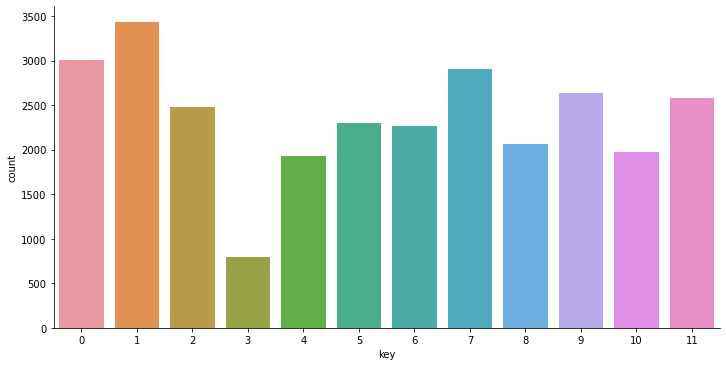

In [29]:
sns.catplot(data=df_main, x='key', kind='count',aspect=2)

plt.show()

In [30]:
df_main.modes.value_counts()

1    16035
0    12321
Name: modes, dtype: int64

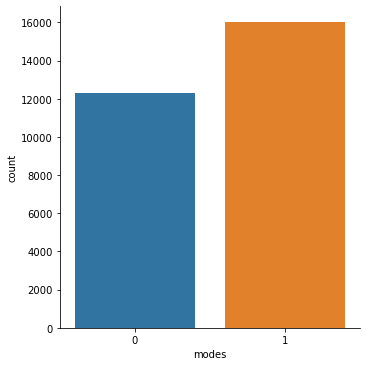

In [31]:
sns.catplot(data=df_main, x='modes', kind='count',aspect=1)

plt.show()

#### For `track_popularity` (output)

The output variable `track_popularity` is an integer between 0 and 100.

In [32]:
df_main.track_popularity.describe()

count    28356.000000
mean        39.329771
std         23.702376
min          0.000000
25%         21.000000
50%         42.000000
75%         58.000000
max        100.000000
Name: track_popularity, dtype: float64

We will first check the distribution of the `trak_popularity` by plotting the histogram.

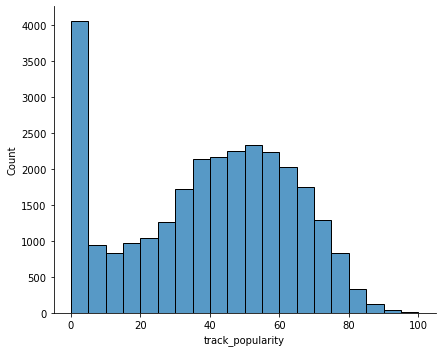

In [33]:
sns.displot(data=df_main, x='track_popularity', binwidth=5,aspect=1.25)

plt.show()

The histogram reveals a "spike" near zer. So we will check if values are identically equal zero. The cell below shows that about 6% of the observations have `track_popularity == 0`

In [34]:
df_main.loc[ df.track_popularity == 0, :].shape[0] / df.shape[0]

0.06426461182347029

We will aslo check if values identically equal 100

In [35]:
df_main.loc[ df.track_popularity == 100, :].shape[0] / df.shape[0]

6.0914324003289374e-05

Since the proportion is so small we will check which songs have a popularity score exactly eqaul to 100.

In [36]:
df_main.loc[ df_main.track_popularity == 100, :]

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,modes,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
9210,2XU0oxnq2qxCpomAAuJY8K,Dance Monkey,Tones and I,100,0UywfDKYlyiu1b38DRrzYD,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,"post-teen alternative, indie, pop (large variety)",1y42gwI5cuwjBslPyQNfqb,pop,post-teen pop,0.824,0.588,6,-6.4,0,0.0924,0.692,0.000104,0.149,0.513,98.027,209438


We see that there is only one song that has the popularity score of 100.

Let's check average popularity score

In [37]:
avg_pop_score = df_main['track_popularity'].mean()

In [38]:
avg_pop_score

39.329771476936095

In [39]:
df_copy = df_main.copy()

In [40]:
df_copy['binary_outcome'] = np.where( df_copy.track_popularity > 45, 1, 0 )

In [41]:
df_copy.binary_outcome.value_counts(normalize=True)

0    0.550078
1    0.449922
Name: binary_outcome, dtype: float64

In [42]:
num_inputs = df_copy.select_dtypes('number').copy().columns.to_list()

In [43]:
num_inputs

['track_popularity',
 'danceability',
 'energy',
 'key',
 'loudness',
 'modes',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
 'binary_outcome']

In [44]:
df_1 = df_copy.copy()

In [45]:
df_1['binary_outcome'] = df_1['binary_outcome'].astype(str)

In [46]:
df_1.dtypes

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
modes                         int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
binary_outcome               object
dtype: object

In [47]:
num_inputs1 = df_1.select_dtypes('float64').copy().columns.to_list()

In [48]:
num_inputs1

['danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo']

In [49]:
lf_num = df_1.melt(id_vars=['binary_outcome'], value_vars = num_inputs1, ignore_index=True)

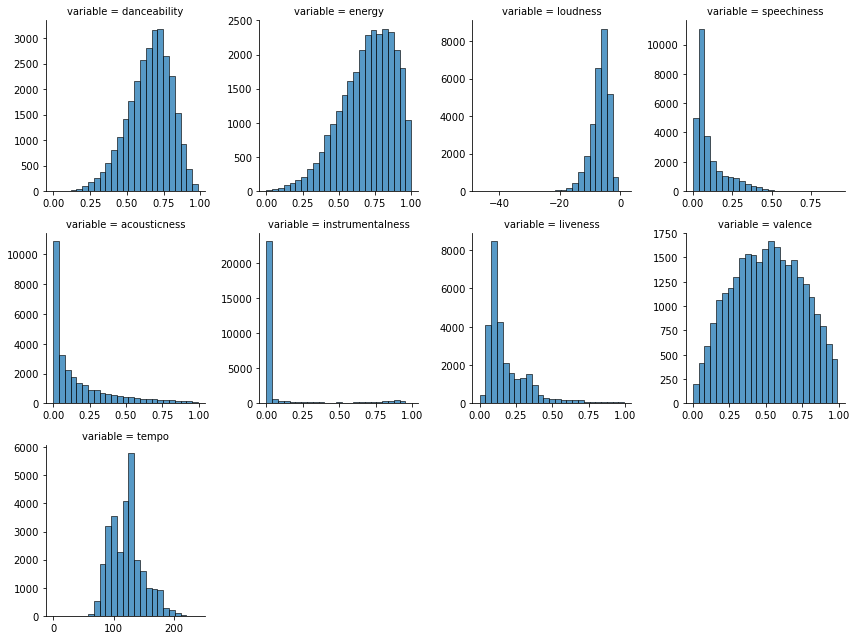

In [50]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.histplot, x='value', bins=25)

plt.show()

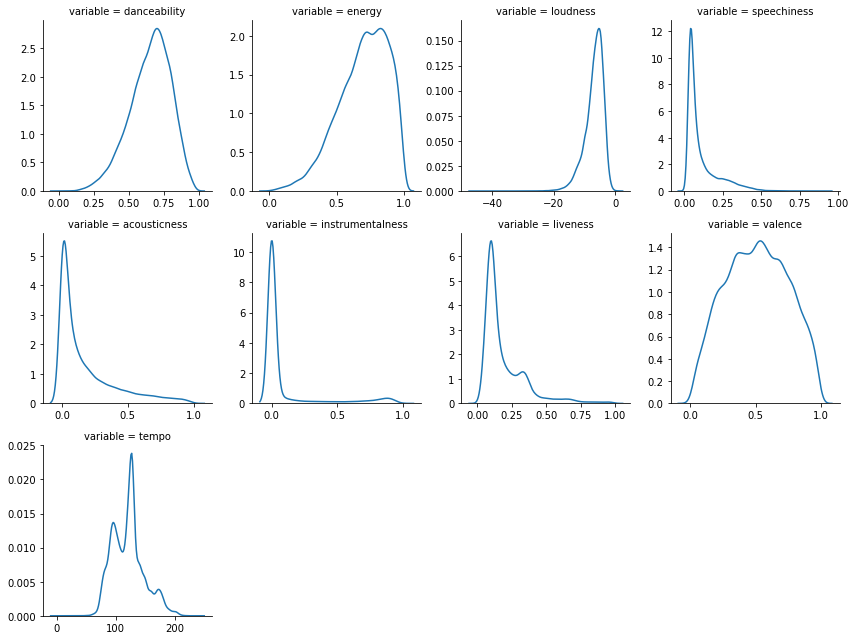

In [51]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.kdeplot, x='value', common_norm=False)

plt.show()

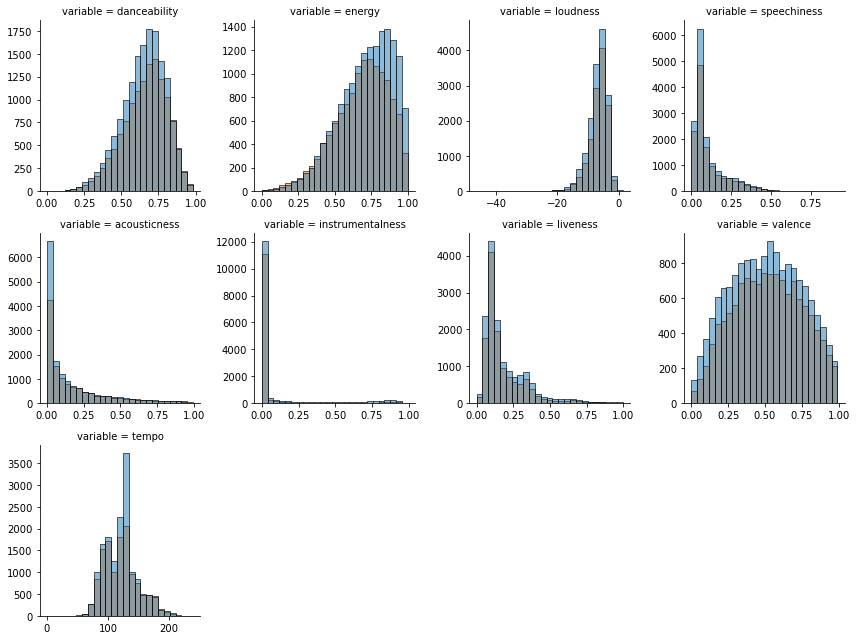

In [56]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.histplot, x='value', hue='binary_outcome', bins=25)

plt.show()

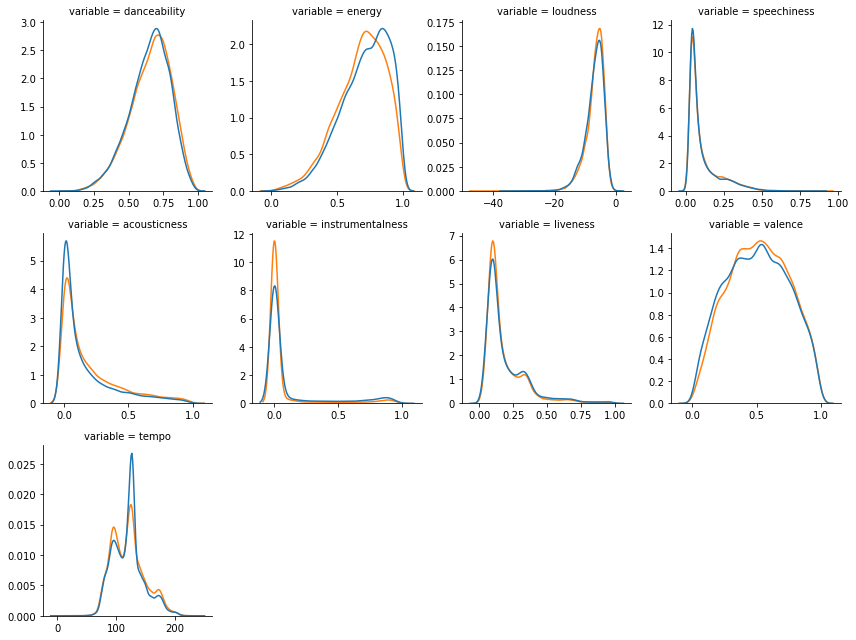

In [52]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.kdeplot, x='value', hue='binary_outcome' ,common_norm=False)

plt.show()

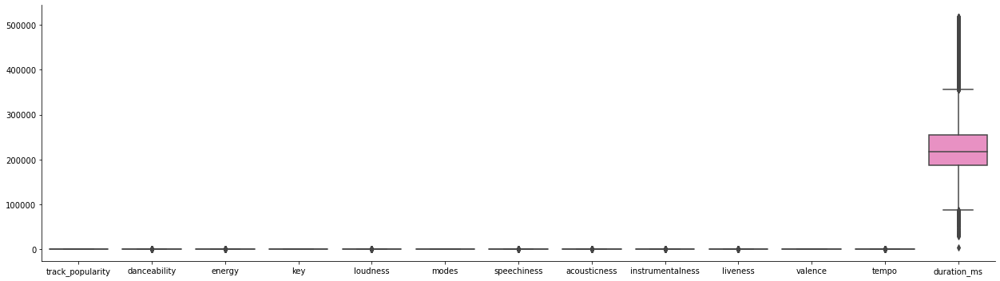

In [57]:
sns.catplot(data = df_main, kind='box', aspect=3.5)

plt.show()

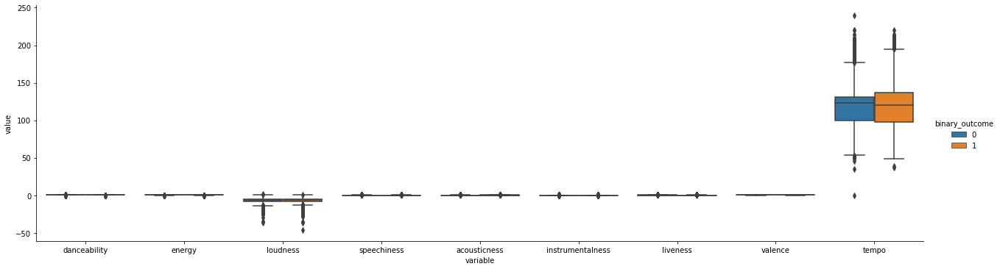

In [61]:
sns.catplot(data = lf_num, x='variable', y='value', hue='binary_outcome', kind='box', aspect=3.5)

plt.show()

In [80]:
df_2 = df_1.copy()

In [81]:
df_2 = df_2.drop(columns=['track_popularity'])

In [82]:
df_2.columns

Index(['track_id', 'track_name', 'track_artist', 'track_album_id',
       'track_album_name', 'track_album_release_date', 'playlist_name',
       'playlist_id', 'playlist_genre', 'playlist_subgenre', 'danceability',
       'energy', 'key', 'loudness', 'modes', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'binary_outcome'],
      dtype='object')

In [84]:
df_2.shape

(28356, 23)

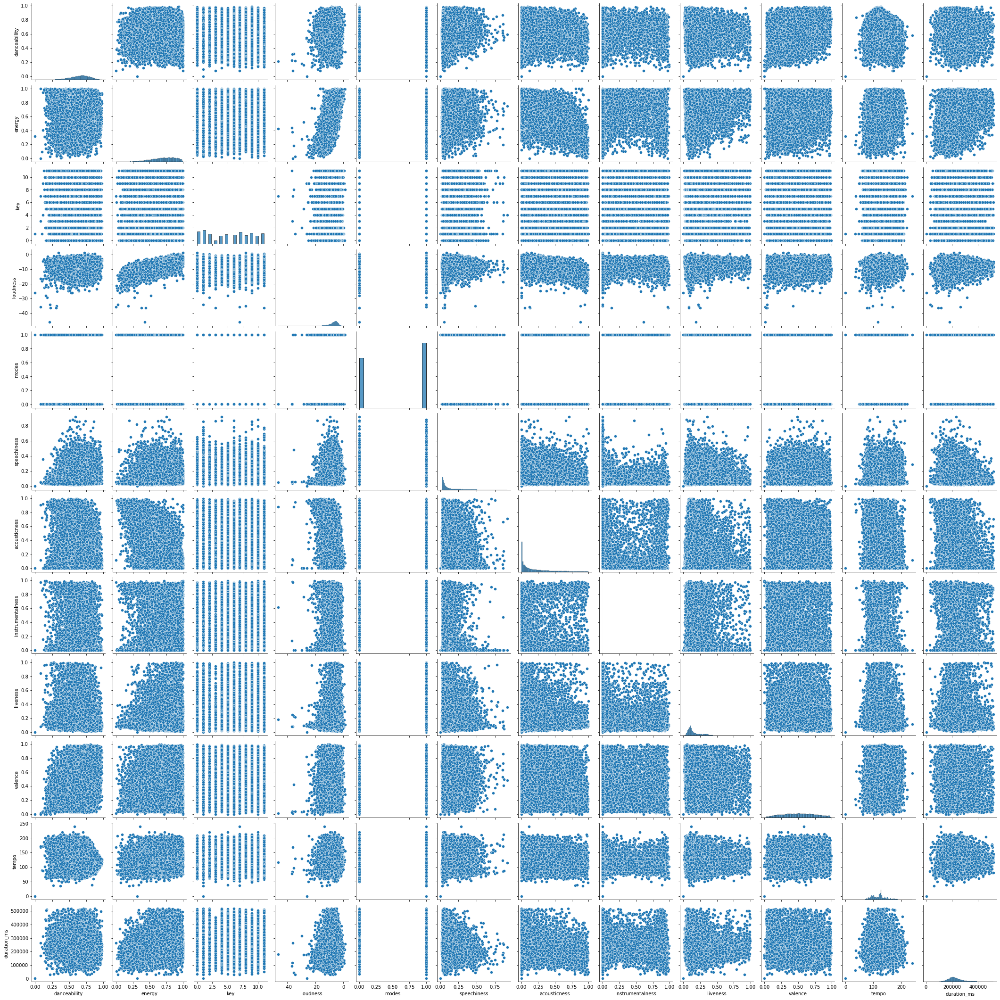

In [85]:
sns.pairplot(data=df_2)

plt.show()

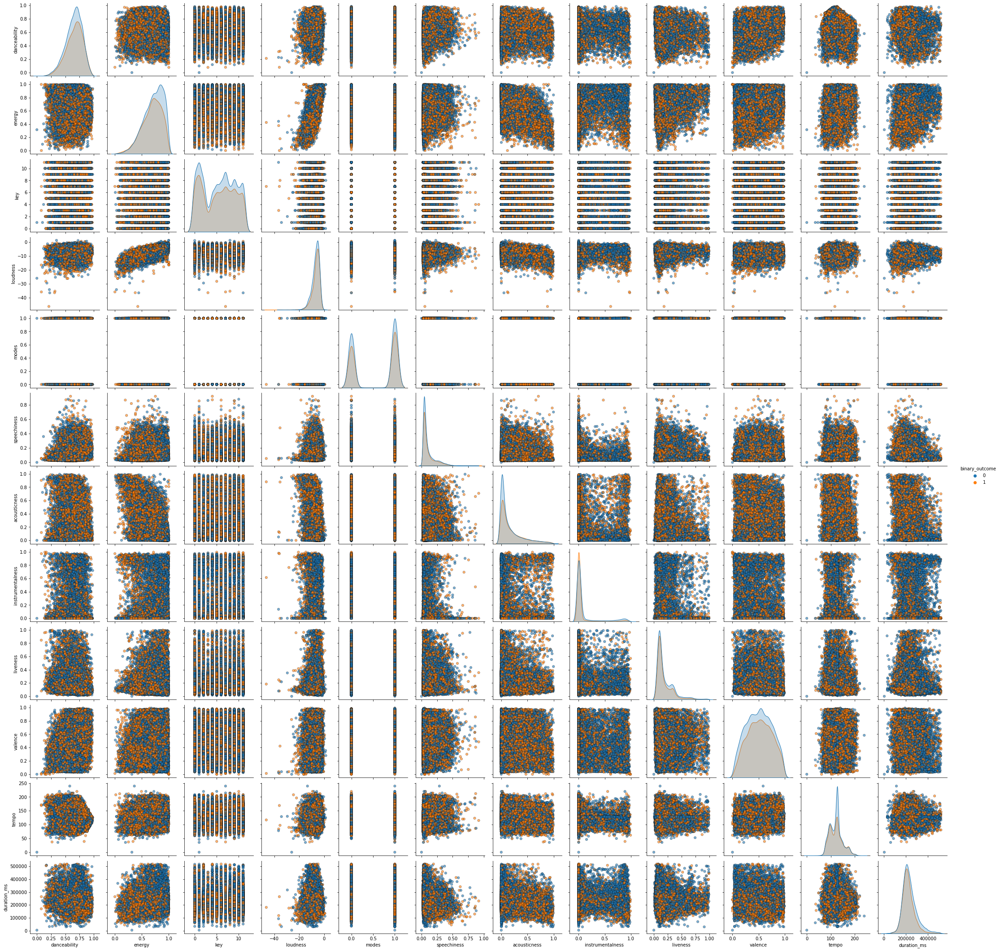

In [86]:
sns.pairplot(data=df_2, hue='binary_outcome', diag_kind = 'kde', plot_kws = {'alpha':0.6, 's':30, 'edgecolor':'k'})

plt.show()

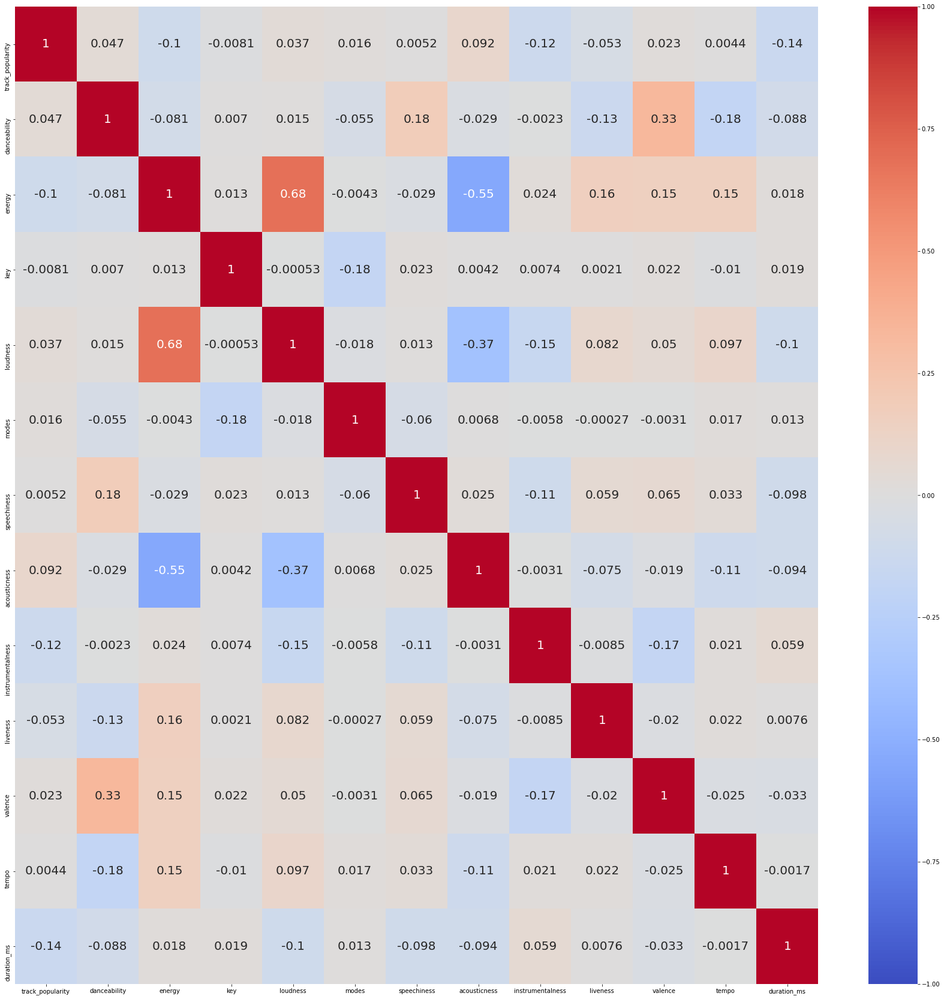

In [54]:
fig, ax = plt.subplots(figsize=(30,30))

sns.heatmap(data = df_main.corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 20},
            ax=ax)

plt.show()